PLA6619 Introduction to Urban Data and Informatics I \
Tuesday, October 27, 2020 \
Week08

# Lab 06: GeoPandas and Spatial Analysis

Please submit __Lab06.ipynb with outputs__ on Canvas by 11:59pm (EST). 

## IMPORTANT: Requirements for geospatial analytics in Python
        
* GeoPandas should be installed before running scripts.
* You should be familiar with sptaial data format (e.g. shapefile) and gemoetry.

__Resources:__
* Geopandas technical documentation (official). https://geopandas.org/ 
* Geopandas technical documentation (GitHub). https://github.com/geopandas/geopandas 
* Geopandas tutorial example. https://www.datacamp.com/community/tutorials/geospatial-data-python 


# Load required packages

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import geopandas as gpd # GeoPandas library for spatial analytics
from shapely.geometry import shape

from urllib.parse import urlencode
import urllib.request, json 

import matplotlib.pyplot as plt
import seaborn as sns # visualization styling package
%matplotlib inline 

In [2]:
print(gpd.__version__)

import pyproj 
print(pyproj.__version__)

0.8.1
2.6.1.post1


# PART 1. Intro to GeoPandas
## 1. Load spatial data

    Syntax:
    VARIABLE_NAME = gpd.read_file('YOUR_FILE_PATH')

In [3]:
# Load spatial datasets

# Example data provided by GeoPandas (Polygon data)
nyc_boro = gpd.read_file(gpd.datasets.get_path('nybb'))

# Shapefile (applicable to GeoJSON as well)
subway_lines = gpd.read_file('../data/Subway Lines/')

# CSV or JSON (with a geometry information column) and convert to spatial data (Point data)
# If you want to use csv or json format file to convert to spatial data, 
# data should have latitude and longitude information
subway_stations = pd.read_json('https://data.cityofnewyork.us/resource/kk4q-3rt2.json')
subway_stations['the_geom'] = subway_stations['the_geom'].apply(shape)
subway_stations = gpd.GeoDataFrame(subway_stations, crs="EPSG:4326").set_geometry('the_geom')

In [4]:
nyc_boro.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [5]:
subway_lines.head()

,id,name,objectid,rt_symbol,shape_len,url,geometry
0,2000393.0,G,753.0,G,2438.200249,http://web.mta.info/nyct/service/,"LINESTRING (-73.99488 40.68020, -73.99427 40.6..."
1,2000394.0,G,754.0,G,3872.834411,http://web.mta.info/nyct/service/,"LINESTRING (-73.97958 40.65993, -73.97966 40.6..."
2,2000469.0,Q,755.0,N,1843.366331,http://web.mta.info/nyct/service/,"LINESTRING (-73.97586 40.57597, -73.97654 40.5..."
3,2000294.0,M,756.0,B,1919.559203,http://web.mta.info/nyct/service/,"LINESTRING (-73.92414 40.75229, -73.92405 40.7..."
4,2000296.0,M,757.0,B,2385.698536,http://web.mta.info/nyct/service/,"LINESTRING (-73.91345 40.75617, -73.90905 40.7..."


In [6]:
subway_stations.head()

,url,objectid,name,the_geom,line,notes
0,http://web.mta.info/nyct/service/,1,Astor Pl,POINT (-73.99107 40.73005),4-6-6 Express,"4 nights, 6-all times, 6 Express-weekdays AM s..."
1,http://web.mta.info/nyct/service/,2,Canal St,POINT (-74.00019 40.71880),4-6-6 Express,"4 nights, 6-all times, 6 Express-weekdays AM s..."
2,http://web.mta.info/nyct/service/,3,50th St,POINT (-73.98385 40.76173),1-2,"1-all times, 2-nights"
3,http://web.mta.info/nyct/service/,4,Bergen St,POINT (-73.97500 40.68086),2-3-4,"4-nights, 3-all other times, 2-all times"
4,http://web.mta.info/nyct/service/,5,Pennsylvania Ave,POINT (-73.89489 40.66471),3-4,"4-nights, 3-all other times"


## 2. Plot spatial data (with default setting)

* Resource: https://geopandas.org/mapping.html

        Syntax:
        YOUR_GEOPANDAS_DATFRAME.plot()

<AxesSubplot:>

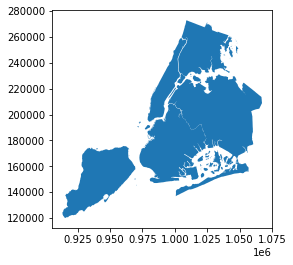

In [7]:
# Default setting
nyc_boro.plot()

<AxesSubplot:>

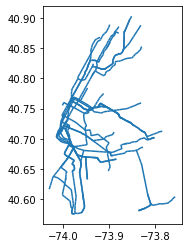

In [8]:
subway_lines.plot()

<AxesSubplot:>

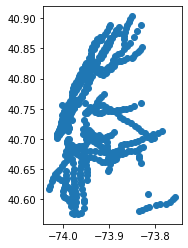

In [9]:
subway_stations.plot()

## 3. Check and convert CRS

    Syntax for checking current CRS:
        YOUR_GEOPANDAS_DATAFRAME.crs
        
    Syntax for a projection:
        YOUR_GEOPANDAS_DATAFRAME.to_crs = "NEW_CRS"
        
__Important notice:__
Depending on a version of GeoPandas and pyproj, you might need a different code. Please refer to this page (https://jorisvandenbossche.github.io/blog/2020/02/11/geopandas-pyproj-crs/) 

In [10]:
print (nyc_boro.crs)
print (nyc_boro.crs.name)
print (nyc_boro.crs.datum)


print (subway_lines.crs)
print (subway_lines.crs.name)

print (subway_stations.crs)

epsg:2263
NAD83 / New York Long Island (ftUS)
North American Datum 1983
epsg:4326
WGS 84
EPSG:4326


In [11]:
nyc_boro.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [12]:
# Let's set crs using the NAD83/New York Long Island (ftUS) - EPSG:2263
subway_lines = subway_lines.to_crs(2263)
subway_stations = subway_stations.to_crs(2263)

In [13]:
print (nyc_boro.crs)
print (subway_lines.crs)
print (subway_stations.crs)

epsg:2263
epsg:2263
epsg:2263


## 4. Plot all spatial data together
* Make sure all data have the same crs
* Colors: https://matplotlib.org/3.1.0/gallery/color/named_colors.html
<img src="https://matplotlib.org/3.1.0/_images/sphx_glr_named_colors_003.png" alt="drawing" width="500"/>
* Colormap types: https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

In [14]:
subway_lines['color'] = 'lightgrey'
subway_lines['color'][subway_lines['name'].str.contains("N|Q|R|W", na=False)] = 'Gold'
subway_lines['color'][subway_lines['name'].str.contains("1|2|3", na=False)] = 'Red'
subway_lines['color'][subway_lines['name'].str.contains("4|5|6", na=False)] = 'Green'
subway_lines['color'][subway_lines['name'].str.contains("A|C|E", na=False)] = 'navy'

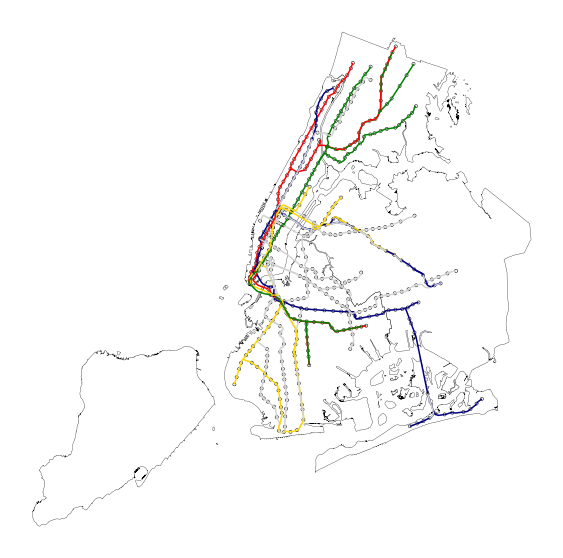

In [15]:
base = nyc_boro.plot(figsize=(10,10), linewidth=0.3, edgecolor='k', facecolor='none')
subway_lines.plot(ax=base, column = 'name', color=subway_lines['color'])
subway_stations.plot(ax=base, markersize = 10, color = 'none', edgecolor='k', linewidth=0.5)

plt.axis(False)
plt.show()

## 5. Add a background map
### Reqiurement: contextily package (The installation takes some time, so please do it yourself after the class)

    Anaconda Prompt (Windows) or terminal (Mac):
    conda install contextily --channel conda-forge
    
* Resource: https://contextily.readthedocs.io/en/latest/providers_deepdive.html

In [16]:
# Load a package
import contextily as ctx

__List of basemap providers__

    'OpenStreetMap.Mapnik',
    'OpenTopoMap',
    'Stamen.Toner',
    'Stamen.TonerLite',
    'Stamen.Terrain',
    'Stamen.TerrainBackground',
    'Stamen.Watercolor',
    'NASAGIBS.ViirsEarthAtNight2012',
    'CartoDB.Positron',
    'CartoDB.Voyager'

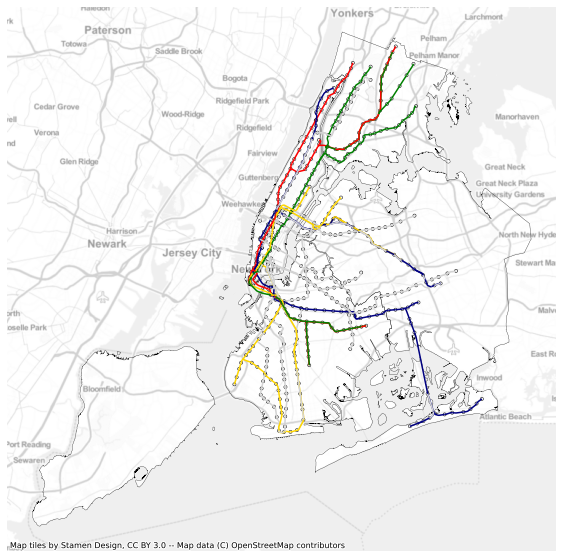

In [17]:
ax = nyc_boro.plot(figsize=(10,10), linewidth=0.3, edgecolor='k', facecolor='none')
subway_lines.plot(ax=ax, column = 'name', color=subway_lines['color'])
subway_stations.plot(ax=ax, markersize = 10, color = 'none', edgecolor='k', linewidth=0.5)
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs='epsg:2263', alpha=0.4)
plt.axis(False)
plt.show()

# PART 2. Exploring NYC 311 data (again!)
## 1. Load data from Open API with the following conditions:
* Complaints reported between October 5, 2020 ~ October 11, 2020
* Only 'Illegal Parking' complaint type

In [18]:
API = 'https://data.cityofnewyork.us/resource/erm2-nwe9.csv?'

# Let's get data collected on last Saturday (10/03/2020)

query = {'$select': '*',
         '$where': 'created_date>="2020-10-05" and created_date<"2020-10-12" and complaint_type="Illegal Parking"', 
         '$limit': 100000} # if you don't specify 'limit', it returns 1000 rows as default

df = pd.read_csv(API + urlencode(query),
                 parse_dates = ['created_date'],
                 dtype = {'incident_zip':'str'})
print (len(df))
df.head()

4881


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,...,vehicle_type,taxi_company_borough,taxi_pick_up_location,bridge_highway_name,bridge_highway_direction,road_ramp,bridge_highway_segment,latitude,longitude,location
0,47795204,2020-10-06 09:03:51,2020-10-06T09:44:58.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)"
1,47805011,2020-10-07 10:33:43,2020-10-07T10:55:28.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)"
2,47836101,2020-10-10 20:34:26,2020-10-10T21:17:16.000,NYPD,New York City Police Department,Illegal Parking,Double Parked Blocking Traffic,Street/Sidewalk,10460,997 EAST 179 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.842334,-73.880404,"\n, \n(40.84233413766623, -73.8804035209231)"
3,47836102,2020-10-10 22:32:11,2020-10-10T23:20:42.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,11355,137-19 56 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.748450,-73.827591,"\n, \n(40.748449536393665, -73.82759077409499)"
4,47807274,2020-10-07 04:05:04,2020-10-07T04:32:24.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)"


## 2. Convert Pandas dataframe to GeoPandas dataframe with geometry

In [19]:
from shapely.geometry import Point # this package function is required to create point geometry

In [20]:
# Create a geometry colomn using latitude and longitude
geometry = [Point(xy) for xy in zip(df['longitude'],df['latitude'])]

# Setting CRS (EPSG:2263) and convert to geopandas dataframe
gdf = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)
# gdf = gdf.to_crs(2263)

gdf.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,...,taxi_company_borough,taxi_pick_up_location,bridge_highway_name,bridge_highway_direction,road_ramp,bridge_highway_segment,latitude,longitude,location,geometry
0,47795204,2020-10-06 09:03:51,2020-10-06T09:44:58.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612)
1,47805011,2020-10-07 10:33:43,2020-10-07T10:55:28.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612)
2,47836101,2020-10-10 20:34:26,2020-10-10T21:17:16.000,NYPD,New York City Police Department,Illegal Parking,Double Parked Blocking Traffic,Street/Sidewalk,10460,997 EAST 179 STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,40.842334,-73.880404,"\n, \n(40.84233413766623, -73.8804035209231)",POINT (-73.88040 40.84233)
3,47836102,2020-10-10 22:32:11,2020-10-10T23:20:42.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,11355,137-19 56 AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.748450,-73.827591,"\n, \n(40.748449536393665, -73.82759077409499)",POINT (-73.82759 40.74845)
4,47807274,2020-10-07 04:05:04,2020-10-07T04:32:24.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,40.876118,-73.864761,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612)


<AxesSubplot:>

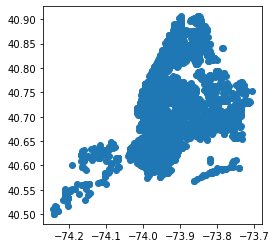

In [21]:
gdf.plot()

## 3. Load NTA data from NYC Open Data

<AxesSubplot:>

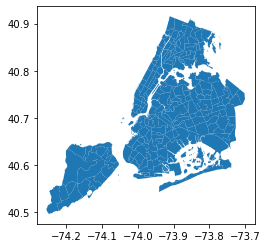

In [22]:
nta = pd.read_json('https://data.cityofnewyork.us/resource/q2z5-ai38.json')
nta['the_geom'] = nta['the_geom'].apply(shape)
nta = gpd.GeoDataFrame(nta, crs="EPSG:4326").set_geometry('the_geom')
# nta = nta.to_crs(2263)
nta.plot()

## 4. Spatial Join of two GeoDataFrame
* We would like to add 'nta' information to the illegal parking data.

        Syntax:
        gpd.sjoin(left_df, right_df, how=~, op=~)
        
        op can be one of 'intersect', 'contains', 'within'. Default is 'interset'.
        
* Before conducting spatial join, the point coordinates containing null should be removed.

In [23]:
print (len(gdf))
gdf = gdf[gdf['latitude'].notnull()]
print (len(gdf))

4881
4827


In [24]:
gdf_nta = gpd.sjoin(gdf, nta, how='left')
gdf_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,...,location,geometry,index_right,boro_code,county_fips,boro_name,ntacode,ntaname,shape_leng,shape_area
0,47795204,2020-10-06 09:03:51,2020-10-06T09:44:58.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612),137,2,5,Bronx,BX44,Williamsbridge-Olinville,27332.421857,3.627561e+07
1,47805011,2020-10-07 10:33:43,2020-10-07T10:55:28.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612),137,2,5,Bronx,BX44,Williamsbridge-Olinville,27332.421857,3.627561e+07
2,47836101,2020-10-10 20:34:26,2020-10-10T21:17:16.000,NYPD,New York City Police Department,Illegal Parking,Double Parked Blocking Traffic,Street/Sidewalk,10460,997 EAST 179 STREET,...,"\n, \n(40.84233413766623, -73.8804035209231)",POINT (-73.88040 40.84233),94,2,5,Bronx,BX17,East Tremont,29633.136379,1.925516e+07
3,47836102,2020-10-10 22:32:11,2020-10-10T23:20:42.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,11355,137-19 56 AVENUE,...,"\n, \n(40.748449536393665, -73.82759077409499)",POINT (-73.82759 40.74845),147,4,81,Queens,QN62,Queensboro Hill,30690.301176,2.654193e+07
4,47807274,2020-10-07 04:05:04,2020-10-07T04:32:24.000,NYPD,New York City Police Department,Illegal Parking,Blocked Hydrant,Street/Sidewalk,10467,3445 HOLLAND AVENUE,...,"\n, \n(40.87611787495612, -73.86476137313596)",POINT (-73.86476 40.87612),137,2,5,Bronx,BX44,Williamsbridge-Olinville,27332.421857,3.627561e+07


## 5. Create choropleth maps of illegal parking in the city every 6hours

In [25]:
# Create 6-hour level timestamp (rounding to nearest 6hour)
gdf_nta['date_hour'] = gdf_nta['created_date'].dt.round('6h')
gdf_nta[['created_date', 'date_hour']].head()

,created_date,date_hour
0,2020-10-06 09:03:51,2020-10-06 12:00:00
1,2020-10-07 10:33:43,2020-10-07 12:00:00
2,2020-10-10 20:34:26,2020-10-10 18:00:00
3,2020-10-10 22:32:11,2020-10-11 00:00:00
4,2020-10-07 04:05:04,2020-10-07 06:00:00


In [26]:
# Groupby date_hour and NTA to count the number of illegar parking complaints in a given NTA
# Once you group data by two columns, output will not have the geometry anymore.

df_311_nta = gdf_nta[['unique_key','date_hour','ntacode']].groupby(['date_hour','ntacode']).count()
df_311_nta.head()

unique_key
date_hour  ntacode            
2020-10-05 BK17              2
           BK25              1
           BK28              3
           BK32              2
           BK37              1

In [27]:
# Reset index and make a pivot table
df_311_nta = df_311_nta.reset_index()
df_311_nta.columns = ['date_hour', 'ntacode', 'illegal_parking_counts']
# Create string type date_hour column
df_311_nta['date_hour_str'] = df_311_nta['date_hour'].astype(str)
df_311_nta.head()

,date_hour,ntacode,illegal_parking_counts,date_hour_str
0,2020-10-05,BK17,2,2020-10-05 00:00:00
1,2020-10-05,BK25,1,2020-10-05 00:00:00
2,2020-10-05,BK28,3,2020-10-05 00:00:00
3,2020-10-05,BK32,2,2020-10-05 00:00:00
4,2020-10-05,BK37,1,2020-10-05 00:00:00


<AxesSubplot:>

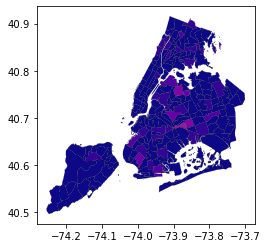

In [28]:
# Sanity check first: 2020-10-05 00am
# If error: conda install -c conda-forge mapclassify
gdf_nta_ip = pd.merge(nta, df_311_nta[df_311_nta['date_hour']=='2020-10-05'], on='ntacode', how='left')
gdf_nta_ip['illegal_parking_counts'] = gdf_nta_ip['illegal_parking_counts'].fillna(0)
ax = gdf_nta_ip.boundary.plot(linewidth=0.2, edgecolor='k', alpha=0.5)
gdf_nta_ip.plot(ax = ax, column='illegal_parking_counts', cmap='plasma', vmax=15)

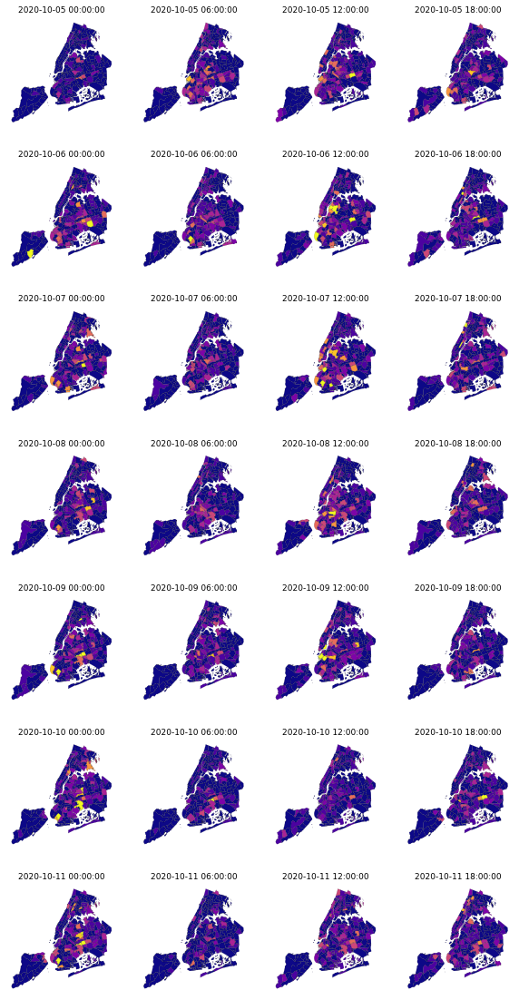

In [29]:
fig, ax = plt.subplots(figsize=(10,20), ncols=4, nrows=7)

i = 0
for d in range(7):
    for h in range(4):
        
        date_hour_list = df_311_nta['date_hour_str'].unique().tolist()

        # Join this table and NTA geometry table
        gdf_nta_ip = pd.merge(nta, df_311_nta[df_311_nta['date_hour_str']==date_hour_list[i]], on='ntacode', how='left')
        gdf_nta_ip['illegal_parking_counts'] = gdf_nta_ip['illegal_parking_counts'].fillna(0)

        # Geography mapping
        mapping = gdf_nta_ip.boundary.plot(ax=ax[d][h], linewidth=0.2, edgecolor='k', alpha=0.5)
        gdf_nta_ip.plot(ax=ax[d][h], column='illegal_parking_counts', cmap='plasma', vmax=8)
        mapping.axis(False)
        mapping.set_title(date_hour_list[i], fontsize=9)
        i += 1        

plt.savefig('../output/mapping_test.png', dpi=150)
plt.show()

# PART 3: Creating interactive map with Folium
Folium builds on the data wrangling strengths of the Python ecosystem and the mapping strengths of the Leaflet.js library. Manipulate your data in Python, then visualize it in on a Leaflet map via Folium.

__Resource__:https://python-visualization.github.io/folium/modules.html

### Requirement: Folium package
        pip install folium 
        OR
        conda install -c conda-forge folium

In [30]:
import folium
from folium.plugins import HeatMap

In [31]:
base_map = folium.Map(location=[40.693943, -73.985880], default_zoom_start = 12,
                     tiles='cartodbdark_matter')
base_map

In [32]:
df['count'] = 1

In [33]:
ddd=df[['latitude','longitude','count']].groupby(['latitude','longitude']).sum()

In [34]:
HeatMap(data=df[['latitude','longitude','count']].groupby(['latitude','longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=11).add_to(base_map)

In [35]:
base_map

In [36]:
df = df[df['longitude'].notnull()]

base_map = folium.Map(location=[40.693943, -73.985880], default_zoom_start = 12,
                     tiles='cartodbdark_matter')

for idx, row in df.iterrows(): # for iterating over rows in dataframe
    folium.CircleMarker(location=[row['latitude'], row['longitude']], 
                        radius=1, 
                        color='blue',
                        popup=row['created_date'],
                       opacity=0.5).add_to(base_map)

In [37]:
base_map

In [38]:
from folium.plugins import MarkerCluster

base_map = folium.Map(location=[40.693943, -73.985880], 
                      zoom_start=12,
                      tiles='cartodbdark_matter')

locations = list(zip(df.latitude, df.longitude))
icons = [folium.Icon(icon="car", prefix="fa") for _ in range(len(locations))]

cluster = MarkerCluster(locations=locations, icons=icons, opacity=0.5)
base_map.add_child(cluster)
base_map

In [39]:
# Export your folium map as html page
base_map.save('../output/folium_test.html')

In [40]:
# import the folium interactive html file

from IPython.display import HTML
HTML('<iframe src=../output/folium_test.html width=700 height=450></iframe>')